In [64]:
#HSV segmentation

In [98]:
%matplotlib inline
from matplotlib import pyplot as plt
from skimage.transform import resize
from skimage import data,color, exposure,feature,io
from math import *
from skimage.color import rgb2gray
import skimage.exposure as imexp
from skimage.morphology import binary_opening,erosion, dilation,  opening, closing, white_tophat,black_tophat
from skimage.filters import gabor_kernel
from skimage.feature import blob_dog, blob_log, blob_doh
from PIL import Image
from scipy import ndimage as ndi
from scipy.ndimage import gaussian_filter
from skimage.exposure import rescale_intensity
import matplotlib.pyplot as plt
from skimage.feature import canny
from skimage.transform import hough_ellipse
from skimage.draw import ellipse_perimeter
from skimage import img_as_float
from skimage.morphology import disk,reconstruction
from skimage.measure import label, regionprops


import numpy as np
np.seterr(divide='ignore', invalid='ignore')
from matplotlib import style

style.use('ggplot')

In [66]:
def preProcessImg(img):
    gausssianSig = 0.4
    
    # Rescale image intensity so that we can see dim features.
    image = img_as_float(img)
    image = gaussian_filter(image,gausssianSig)
#     image = rescale_intensity(image, in_range=(50, 200))
    
    return image

In [67]:
#loading data

In [68]:


imgSamples = [];
imgHsvSamples = [];


patches = [];
patchesHsv = [];


whitePatches = [];
whitePatchesHsv = [];

blackPatches = [];
blackPatchesHsv = [];


lesionPatches = [];
lesionPatchesHsv = [];


samplingSize =(300,300)
#samplingMode = 'nearest'
samplingMode = 'wrap'






for i in range(0,15):
    imgSamples.append(preProcessImg(resize(np.array(Image.open('newSamples/'+str(i+1)+'.jpg')), samplingSize,mode=samplingMode)))
                      
for i in range(len(imgSamples)):
    imgHsvSamples.append(color.rgb2hsv(imgSamples[i]))
    
    
for i in range(0,2):
    patches.append(preProcessImg(np.array(Image.open('newPatches/normal'+str(i+1)+'.jpg'))))
                      
for i in range(len(patches)):
    patchesHsv.append(color.rgb2hsv(patches[i]))
    
for i in range(0,1):
    whitePatches.append(preProcessImg(np.array(Image.open('newPatches/white'+str(i+1)+'.jpg'))))
                      
for i in range(len(whitePatches)):
    whitePatchesHsv.append(color.rgb2hsv(whitePatches[i]))

for i in range(0,2):
    blackPatches.append(preProcessImg( np.array(Image.open('patches/black'+str(i+1)+'.jpg'))))
    
for i in range(len(blackPatches)):
    blackPatchesHsv.append(color.rgb2hsv(blackPatches[i]))
    
for i in range(0,4):
    lesionPatches.append(preProcessImg(np.array(Image.open('newPatches/lesion'+str(i+1)+'.jpg'))))
    
for i in range(len(lesionPatches)):
    lesionPatchesHsv.append(color.rgb2hsv(lesionPatches[i]))


print(len(imgHsvSamples))  
print(len(patchesHsv)) 
print(len(whitePatchesHsv)) 
print(len(blackPatchesHsv)) 
print(len(lesionPatches)) 
print(imgHsvSamples[0].shape)
print(patchesHsv[0].shape)
print(whitePatchesHsv[0].shape)
print(blackPatchesHsv[0].shape)
print(lesionPatchesHsv[0].shape)

15
2
1
2
4
(300, 300, 3)
(100, 100, 3)
(50, 50, 3)
(100, 100, 3)
(74, 59, 3)


In [69]:
##saturation thresholding

In [70]:
def satThreshold(v,s):    ##return hue or intensity as dominant feature
    th = 1.0 - 0.8*v;
    if(s>th):
        return "h"
    else: 
        return "v"
    

In [71]:
def approximate(img):
    tmpImg = np.zeros(img.shape)
    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            dominantVal = satThreshold(img[i,j,2],img[i,j,1])
#             print("dominantVal----"+dominantVal)
            tmpImg[i,j,:] = img[i,j,:]
            if dominantVal == "h":
                tmpImg[i,j,0] = img[i,j,0]
                tmpImg[i,j,1] = 1.0
                tmpImg[i,j,2] = 1.0
                
            else:
                tmpImg[i,j,0] = 1.0
                tmpImg[i,j,1] = 1.0
                tmpImg[i,j,2] = img[i,j,2]
        
    return tmpImg

In [72]:
###Gabor filter

def filterImage(image, kernels):
    filtered = []
    for k, kernel in enumerate(kernels):
        filtered.append(ndi.convolve(image, kernel, mode='wrap'))
    return filtered

In [73]:
def mass_compute_and_combine_feats(filteredImg,hsvImg,aprocHsvImg):
    
    coreFeatsLen = hsvImg.shape[2]+aprocHsvImg.shape[2]
    textTureFeatsLen = len(filteredImg)*3
    dim = textTureFeatsLen+coreFeatsLen
    feats = np.zeros((filteredImg[0].shape[0],filteredImg[0].shape[1],dim))
    step = 0
    
#     merged_img = np.mean(filteredImg,axis=0)
        
#     for i in range(merged_img.shape[0]):
#         for j in range(merged_img.shape[1]):
#             window = merged_img[max(i-1,0):min(i+1,merged_img.shape[0]-1),max(j-1,0):min(j+1,merged_img.shape[1]-1)]

#             feats[i,j, 0] = window.mean()
#             feats[i,j, 1] = window.var()
#             feats[i,j, 2] = merged_img[i,j]
#             feats[i,j, 3] = hsvImg[i,j,0]
#             feats[i,j, 4] = hsvImg[i,j,1]
#             feats[i,j, 5] = hsvImg[i,j,2]
#             feats[i,j, 6] = aprocHsvImg[i,j,0]
#             feats[i,j, 7] = aprocHsvImg[i,j,1]
#             feats[i,j, 8] = aprocHsvImg[i,j,2]
 
#     return feats
    
    for m_index,image in enumerate(filteredImg):
        for i in range(image.shape[0]):
            for j in range(image.shape[1]):
                window = image[max(i-1,0):min(i+1,image.shape[0]-1),max(j-1,0):min(j+1,image.shape[1]-1)]
                feats[i,j, step] = window.mean()
                feats[i,j, step+1] = window.var()
                feats[i,j, step+2] = image[i,j]
                if step+3 == textTureFeatsLen:
                    
                    feats[i,j, step+3] = hsvImg[i,j,0]
                    feats[i,j, step+4] = hsvImg[i,j,1]
                    feats[i,j, step+5] = hsvImg[i,j,2]
                    feats[i,j, step+6] = aprocHsvImg[i,j,0]
                    feats[i,j, step+7] = aprocHsvImg[i,j,1]
                    feats[i,j, step+8] = aprocHsvImg[i,j,2]
                
        step += 3
 
    return feats

In [74]:
def mass_compute_and_combine_feats2(filteredImg,hsvImg):
    
    coreFeatsLen = hsvImg.shape[2]
    textTureFeatsLen = len(filteredImg)*3
    dim = textTureFeatsLen+coreFeatsLen
    feats = np.zeros((filteredImg[0].shape[0],filteredImg[0].shape[1],dim))
    step = 0
    
    
    for m_index,image in enumerate(filteredImg):
        for i in range(image.shape[0]):
            for j in range(image.shape[1]):
                window = image[max(i-1,0):min(i+1,image.shape[0]-1),max(j-1,0):min(j+1,image.shape[1]-1)]
                feats[i,j, step] = window.mean()
                feats[i,j, step+1] = window.var()
                feats[i,j, step+2] = image[i,j]
                if step+3 == textTureFeatsLen:
                    
                    feats[i,j, step+3] = hsvImg[i,j,0]
                    feats[i,j, step+4] = hsvImg[i,j,1]
                    feats[i,j, step+5] = hsvImg[i,j,2]
                
        step += 3
 
    return feats

In [75]:
def mass_compute_and_combine_feats3(filteredImg,aprocHsvImg):
    
    coreFeatsLen = aprocHsvImg.shape[2]
    textTureFeatsLen = len(filteredImg)*3
    dim = textTureFeatsLen+coreFeatsLen
    feats = np.zeros((filteredImg[0].shape[0],filteredImg[0].shape[1],dim))
    step = 0
    
    for m_index,image in enumerate(filteredImg):
        for i in range(image.shape[0]):
            for j in range(image.shape[1]):
                window = image[max(i-1,0):min(i+1,image.shape[0]-1),max(j-1,0):min(j+1,image.shape[1]-1)]
                feats[i,j, step] = window.mean()
                feats[i,j, step+1] = window.var()
                feats[i,j, step+2] = image[i,j]
                if step+3 == textTureFeatsLen:
                    
                    feats[i,j, step+3] = aprocHsvImg[i,j,0]
                    feats[i,j, step+4] = aprocHsvImg[i,j,1]
                    feats[i,j, step+5] = aprocHsvImg[i,j,2]
                
        step += 3
 
    return feats

In [76]:
def mass_compute_and_combine_feats4(filteredImg,hsvImg,aprocHsvImg):
    
    coreFeatsLen = hsvImg.shape[2]+aprocHsvImg.shape[2]
    textTureFeatsLen = len(filteredImg)*3
    dim = textTureFeatsLen+coreFeatsLen
    feats = np.zeros((filteredImg[0].shape[0],filteredImg[0].shape[1],dim))
    step = 0
    
    for m_index,image in enumerate(filteredImg):
        for i in range(image.shape[0]):
            for j in range(image.shape[1]):
                window = image[max(i-1,0):min(i+1,image.shape[0]-1),max(j-1,0):min(j+1,image.shape[1]-1)]
                feats[i,j, step] = np.sum(window**2)
                feats[i,j, step+1] =  np.sum(np.absolute(window))
                feats[i,j, step+2] = image[i,j]
                if step+3 == textTureFeatsLen:
                    
                    feats[i,j, step+3] = hsvImg[i,j,0]
                    feats[i,j, step+4] = hsvImg[i,j,1]
                    feats[i,j, step+5] = hsvImg[i,j,2]
                    feats[i,j, step+6] = aprocHsvImg[i,j,0]
                    feats[i,j, step+7] = aprocHsvImg[i,j,1]
                    feats[i,j, step+8] = aprocHsvImg[i,j,2]
                
        step += 3
 
    return feats

In [77]:
def mass_compute_and_combine_feats5(filteredImg,hsvImg,aprocHsvImg):
    
    coreFeatsLen = hsvImg.shape[2]+aprocHsvImg.shape[2]
    textTureFeatsLen = len(filteredImg)*5
    dim = textTureFeatsLen+coreFeatsLen
    feats = np.zeros((filteredImg[0].shape[0],filteredImg[0].shape[1],dim))
    step = 0
    
    for m_index,image in enumerate(filteredImg):
        for i in range(image.shape[0]):
            for j in range(image.shape[1]):
                window = image[max(i-1,0):min(i+1,image.shape[0]-1),max(j-1,0):min(j+1,image.shape[1]-1)]
                feats[i,j, step] = np.sum(window**2)
                feats[i,j, step+1] =  np.sum(np.absolute(window))
                feats[i,j, step+2] = image[i,j]
                feats[i,j, step+3] = window.mean()
                feats[i,j, step+4] = window.var()
                if step+3 == textTureFeatsLen:
                    
                    feats[i,j, step+5] = hsvImg[i,j,0]
                    feats[i,j, step+6] = hsvImg[i,j,1]
                    feats[i,j, step+7] = hsvImg[i,j,2]
                    feats[i,j, step+8] = aprocHsvImg[i,j,0]
                    feats[i,j, step+9] = aprocHsvImg[i,j,1]
                    feats[i,j, step+10] = aprocHsvImg[i,j,2]
                
        step += 3
 
    return feats

In [78]:
def mass_compute_and_combine_feats6(filteredImg,hsvImg,aprocHsvImg):
    
    coreFeatsLen = 0
    textTureFeatsLen = len(filteredImg)*5
    dim = textTureFeatsLen+coreFeatsLen
    feats = np.zeros((filteredImg[0].shape[0],filteredImg[0].shape[1],dim))
    step = 0
    
    for m_index,image in enumerate(filteredImg):
        for i in range(image.shape[0]):
            for j in range(image.shape[1]):
                window = image[max(i-1,0):min(i+1,image.shape[0]-1),max(j-1,0):min(j+1,image.shape[1]-1)]
                feats[i,j, step] = np.sum(window**2)
                feats[i,j, step+1] =  np.sum(np.absolute(window))
                feats[i,j, step+2] = image[i,j]
                feats[i,j, step+3] = window.mean()
                feats[i,j, step+4] = window.var()
                
        step += 3
 
    return feats

In [79]:


# def ref_img_feats(which=1):
#     ref_feats = {}
    

   
#     for i in range(len(patchesHsv)):
#         imgToFilter = rgb2gray(patches[i])
#         filtredImg =  filterImage(imgToFilter,kernels)
        
        
#         if which ==1:
#             ref_feats[i] = mass_compute_and_combine_feats(filtredImg,patchesHsv[i],approximate(patchesHsv[i]))
    
#         elif which == 2:
#             ref_feats[i] =  mass_compute_and_combine_feats2(filtredImg,patchesHsv[i])
#         elif which == 3:
#             ref_feats[i] =  mass_compute_and_combine_feats3(filtredImg,approximate(patchesHsv[i]))
#         elif which == 4:
#             ref_feats[i] = mass_compute_and_combine_feats4(filtredImg,patchesHsv[i],approximate(patchesHsv[i]))

#         ref_feats[i] = np.mean(ref_feats[i], axis=0) 
#     return ref_feats

In [80]:
# print(ref_img_feats())

In [81]:
# def ref_white_img_feats(which=1):
    
#     ref_feats = {}
    
#     for i in range(len(whitePatchesHsv)):
#         imgToFilter = rgb2gray(whitePatches[i])
#         filtredImg = filterImage(imgToFilter,kernels)
        
         
#         if which ==1 :
#             ref_feats[i] = mass_compute_and_combine_feats(filtredImg,whitePatchesHsv[i],approximate(whitePatchesHsv[i]))

    
#         elif which == 2:
#             ref_feats[i] =  mass_compute_and_combine_feats2(filtredImg,whitePatchesHsv[i])
#         elif which == 3:
#             ref_feats[i] =  mass_compute_and_combine_feats3(filtredImg,approximate(whitePatchesHsv[i]))
#         elif which == 4:
#             ref_feats[i] = mass_compute_and_combine_feats4(filtredImg,whitePatchesHsv[i],approximate(whitePatchesHsv[i]))
#         ref_feats[i] = np.mean(ref_feats[i], axis=0)

#     return ref_feats

In [82]:
# print(ref_white_img_feats())

In [83]:
# def ref_black_img_feats(which=1):
    
#     ref_feats = {}
    
#     for i in range(len(blackPatchesHsv)):
#         imgToFilter = rgb2gray(blackPatches[i])
#         filtredImg = filterImage(imgToFilter,kernels)
        
#         if which ==1 :
#             ref_feats[i] = mass_compute_and_combine_feats(filtredImg,blackPatchesHsv[i],approximate(blackPatchesHsv[i]))

#         elif which == 2:
#             ref_feats[i] =  mass_compute_and_combine_feats2(filtredImg,blackPatchesHsv[i])
#         elif which == 3:
#             ref_feats[i] =  mass_compute_and_combine_feats3(filtredImg,approximate(blackPatchesHsv[i]))
#         elif which == 4:
#             ref_feats[i] = mass_compute_and_combine_feats4(filtredImg,blackPatchesHsv[i],approximate(blackPatchesHsv[i]))
#         ref_feats[i] = np.mean(ref_feats[i], axis=0)
        
        
#     return ref_feats

In [84]:

# def ref_lesion_img_feats(which=1):

    
#     for i in range(len(lesionPatchesHsv)):
#         imgToFilter = rgb2gray(lesionPatches[i])
#         filtredImg = filterImage(imgToFilter,kernels)         
#         if which ==1 :
#             ref_feats[i] = mass_compute_and_combine_feats(filtredImg,lesionPatchesHsv[i],approximate(lesionPatchesHsv[i]))
#         elif which == 2:
#             ref_feats[i] =  mass_compute_and_combine_feats2(filtredImg,lesionPatchesHsv[i])
#         elif which == 3:
#             ref_feats[i] =  mass_compute_and_combine_feats3(filtredImg,approximate(lesionPatchesHsv[i]))
#         elif which == 4:
#             ref_feats[i] = mass_compute_and_combine_feats4(filtredImg,lesionPatchesHsv[i],approximate(lesionPatchesHsv[i]))
#         ref_feats[i] = np.mean(ref_feats[i], axis=0)

        
#     return ref_feats

In [85]:

def ref_img_feats(patchesName,which=1):
    
    
    if patchesName == 'normal':   
        targetImg = patches
        targetImgHSV = patchesHsv
    elif patchesName == 'white':
        targetImg = whitePatches
        targetImgHSV = whitePatchesHsv
    elif patchesName == 'black':
        targetImg = blackPatches
        targetImgHSV = blackPatchesHsv
    elif patchesName == 'lesion':
        targetImg = lesionPatches
        targetImgHSV = lesionPatchesHsv
        
    
    ref_feats = {}

    
    for i in range(len(targetImgHSV)):
        imgToFilter = rgb2gray(targetImg[i])
        filtredImg = filterImage(imgToFilter,kernels)     
        
        if which ==1 :
            ref_feats[i] = mass_compute_and_combine_feats(filtredImg,targetImgHSV[i],approximate(targetImgHSV[i]))
        elif which == 2:
            ref_feats[i] =  mass_compute_and_combine_feats2(filtredImg,targetImgHSV[i])
        elif which == 3:
            ref_feats[i] =  mass_compute_and_combine_feats3(filtredImg,approximate(targetImgHSV[i]))
        elif which == 4:
            ref_feats[i] = mass_compute_and_combine_feats4(filtredImg,targetImgHSV[i],approximate(targetImgHSV[i]))

        elif which == 5:
            ref_feats[i] = mass_compute_and_combine_feats5(filtredImg,targetImgHSV[i],approximate(targetImgHSV[i]))

        elif which == 6:
            ref_feats[i] = mass_compute_and_combine_feats6(filtredImg,targetImgHSV[i],approximate(targetImgHSV[i]))
        ref_feats[i] = np.mean(ref_feats[i], axis=0)
        
    return ref_feats

In [86]:
###k-means for features


####k-means class



class K_Means_Feats:
    def __init__(self, k=10, tol=0.001, max_iter=300):
        self.k = k
        self.tol = tol
        self.max_iter = max_iter
        self.rgbColors = np.array([[0,255,0],[255,255,255],[0,0,0],[255,0,0],[0,0,255],[255,255,0],[0,255,255],[255,0,255],[51,51,255],[102,102,0],[255,0,127],[160,32,240],[238,130,238]])
        self.rgbColors.astype(float)
#        white, green, ,red, yellow, purple,violet



    
    
    def fit(self,img,which=1):

        self.centroids = {}
        
        tempImg = img

        p_index = len(patches)
        w_p_index = len(patches)+len(whitePatches)
        b_p_index = len(patches)+len(whitePatches)+len(blackPatches)
        
        
        
        
        ref_feats_n = ref_feats_dict[which-1][0]
        ref_feats_w = ref_feats_dict[which-1][1]
        ref_feats_b = ref_feats_dict[which-1][2]
        ref_feats_l = ref_feats_dict[which-1][3]
        
        
#         if which==1:
#             ref_feats_n = ref_feats_normal
#             ref_feats_w = ref_feats_white
#             ref_feats_b = ref_feats_black
#             ref_feats_l = ref_feats_lesion
#         elif which ==2:
#             ref_feats_n = ref_feats_normal2
#             ref_feats_w = ref_feats_white2
#             ref_feats_b = ref_feats_black2
#             ref_feats_l = ref_feats_lesion2
            
#         elif which ==3:
#             ref_feats_n = ref_feats_normal3
#             ref_feats_w = ref_feats_white3
#             ref_feats_b = ref_feats_black3
#             ref_feats_l = ref_feats_lesion3
            
#         elif which == 4:
#             ref_feats_n = ref_feats_normal4
#             ref_feats_w = ref_feats_white4
#             ref_feats_b = ref_feats_black4
#             ref_feats_l = ref_feats_lesion4
#         elif which == 5:
#             ref_feats_n = ref_feats_normal5
#             ref_feats_w = ref_feats_white5
#             ref_feats_b = ref_feats_black5
#             ref_feats_l = ref_feats_lesion5
#         elif which == 5:
#             ref_feats_n = ref_feats_normal5
#             ref_feats_w = ref_feats_white5
#             ref_feats_b = ref_feats_black5
#             ref_feats_l = ref_feats_lesion5
            

        
        #centroids for normal parts of the esophagus
        for i in range(len(patches)):
            self.centroids[i] = ref_feats_n[i][0]
        #centroids for white and bright parts
        for i in range(len(whitePatches)):
            self.centroids[p_index+i] = ref_feats_w[i][0]
        #centroids for black parts
        for i in range(len(blackPatches)):
            self.centroids[w_p_index+i] = ref_feats_b[i][0] 
            
        for i in range(len(lesionPatches)):
            self.centroids[b_p_index+i] = ref_feats_l[i][0]     
        #ramdomly select centroid for the lesions   
#         self.centroids[self.k-1] = img[0,0,:]
      

        for i in range(self.max_iter):
            self.clusters = {}
            self.clustersIndeces = {}
                ##classes holder
            for i in range(self.k):
                self.clusters[i] = []
                self.clustersIndeces[i] = []
        
            for i in range(img.shape[0]):
                for j in range(img.shape[1]):
                    distances = [np.linalg.norm(img[i,j,:]-self.centroids[centroid]) for centroid in self.centroids]
                    clust_index = distances.index(min(distances))
                    self.clustersIndeces[clust_index].append([i,j])
                    self.clusters[clust_index].append(img[i,j,:])
                    
            prev_centroids = dict(self.centroids)         
            
            ##  re-assign centroids 
            for item in self.clusters:
                self.centroids[item] = np.average(self.clusters[item],axis=0)

            optimized = True
            
            for c in self.centroids:
                original_centroid = prev_centroids[c]
                current_centroid = self.centroids[c]
                if np.sum((current_centroid-original_centroid)/((original_centroid)*100.0)) > self.tol:
                    optimized = False

            if optimized:
                break
        
        output = np.zeros((img.shape[0],img.shape[1],3),np.uint8); 
        
##assigning colors  

        for cent in self.centroids:
            for pair in self.clustersIndeces[cent]:
                
                if  (cent < p_index): #normal pixels---assign green color
                    output[pair[0],pair[1],0] = self.rgbColors[0][0]
                    output[pair[0],pair[1],1] = self.rgbColors[0][1]
                    output[pair[0],pair[1],2] = self.rgbColors[0][2]
                    
                elif  (cent >= p_index) & (cent < w_p_index): #white pixels----assign white color
                    output[pair[0],pair[1],0] = self.rgbColors[1][0]
                    output[pair[0],pair[1],1] = self.rgbColors[1][1]
                    output[pair[0],pair[1],2] = self.rgbColors[1][2]
                    
                elif  (cent >= w_p_index) & (cent < b_p_index): # black pixels---assign black color
                    output[pair[0],pair[1],0] = self.rgbColors[2][0]
                    output[pair[0],pair[1],1] = self.rgbColors[2][1]
                    output[pair[0],pair[1],2] = self.rgbColors[2][2] 
                    
                elif  (cent >= b_p_index): #lesions------assign red color
                    output[pair[0],pair[1],0] = self.rgbColors[3][0]
                    output[pair[0],pair[1],1] = self.rgbColors[3][1]
                    output[pair[0],pair[1],2] = self.rgbColors[3][2] 
                    
        return output
    
    
    
    
    
    
    
    
    
    
    def fit_and_filter(self,img):

        self.centroids = {}
        
        tempImg = img

        p_index = len(patches)
        w_p_index = len(patches)+len(whitePatches)
        b_p_index = len(patches)+len(whitePatches)+len(blackPatches)

        ref_feats_n = ref_feats_normal
        ref_feats_w = ref_feats_white
        ref_feats_b = ref_feats_black
        ref_feats_l = ref_feats_lesion
            
            
        
        print('indeces----')
        print p_index
        print w_p_index
        
        for i in range(len(patches)):
            self.centroids[i] = ref_feats_n[i][0]
        #centroids for white and bright parts
        for i in range(len(whitePatches)):
            self.centroids[p_index+i] = ref_feats_w[i][0]
        #centroids for black parts
        for i in range(len(blackPatches)):
            self.centroids[w_p_index+i] = ref_feats_b[i][0] 
            
        for i in range(len(lesionPatches)):
            self.centroids[b_p_index+i] = ref_feats_l[i][0]     
            

        for i in range(self.max_iter):
            self.clusters = {}
            self.clustersIndeces = {}
                ##classes holder
            for i in range(self.k):
                self.clusters[i] = []
                self.clustersIndeces[i] = []
        
            for i in range(img.shape[0]):
                for j in range(img.shape[1]):
                    distances = [np.linalg.norm(img[i,j,:]-self.centroids[centroid]) for centroid in self.centroids]
                    clust_index = distances.index(min(distances))
                    self.clustersIndeces[clust_index].append([i,j])
                    self.clusters[clust_index].append(img[i,j,:])
                    
            prev_centroids = dict(self.centroids)         
            
            ##  re-assign centroids 
            for item in self.clusters:
                self.centroids[item] = np.average(self.clusters[item],axis=0)

            optimized = True
            
            for c in self.centroids:
                original_centroid = prev_centroids[c]
                current_centroid = self.centroids[c]
                if np.sum((current_centroid-original_centroid)/((original_centroid)*100.0)) > self.tol:
                    optimized = False

            if optimized:
                break
        
        output = np.zeros((img.shape[0],img.shape[1]),np.uint8); 
        
##assigning colors  

        for cent in self.centroids:
            for pair in self.clustersIndeces[cent]: 
                if  (cent >= b_p_index): #lesions------assign red color
                    output[pair[0],pair[1]] = 255
                    
        return binary_opening(binary_opening(output, disk(3)),disk(3))


In [87]:
# preparing Gabor filter bank kernels
kernels = []
for theta in np.arange(0, np.pi, np.pi / 6):
    for sigma in (1.0,1.5):  #gausian kernel window size
#         for frequency in (0.1, 0.2):
            kernel = np.real(gabor_kernel(0.15, theta=theta,sigma_x=sigma, sigma_y=sigma))
            kernels.append(kernel)

In [88]:
##prepare reference features
ref_feats_dict = {}

# for i in range(6):
#     ref_feats_dict[i]=[]
#     ref_feats_dict[i].append(ref_img_feats('normal',which=i+1))
#     ref_feats_dict[i].append(ref_img_feats('white',which=i+1))
#     ref_feats_dict[i].append(ref_img_feats('black',which=i+1))
#     ref_feats_dict[i].append(ref_img_feats('lesion',which=i+1))
    
# print "ref_feats_dict"
# print ref_feats_dict
# print "ref_feats_dict[0]--->>>>>>-----"
# print ref_feats_dict[0]
# print "ref_feats_dict[0][0]--->>>>>>-----"
# print ref_feats_dict[0][0]


In [89]:
##applying to imgSamples

In [90]:
# colnum = 8
# # rownum = int(math.floor((float(len(imgSamples))/ float(colnum))+1))
# rownum = len(imgSamples)
# # print(rownum)


# fig, axes = plt.subplots(rownum, colnum, figsize=(65, rownum*10), sharex=True, sharey=True)
# ax = axes.ravel()
# index = 0

# # divide into white, black, normal and abonomal parts of the esophagus
# kmeanf = K_Means_Feats(len(patches)+len(whitePatches)+len(blackPatches)+len(lesionPatches))

# for i in range(0, len(imgHsvSamples)):
    
#     imgToFilter = rgb2gray(imgSamples[i])
    
#     filtredImg = filterImage(imgToFilter,kernels)
   
    
#     print("len(filtredImg) ")
#     print(len(filtredImg))
#     print(filtredImg[0].shape)
    
#     ax[index].imshow(imgSamples[i],cmap='gray')
#     ax[index].set_title("original rgb "+str(i))
#     ax[index].axis('off') 
   
#     ax[index+1].imshow(approximate(imgHsvSamples[i]),cmap='gray')
#     ax[index+1].set_title("segmented "+str(i))
#     ax[index+1].axis('off')

         
#     ax[index+2].imshow(kmeanf.fit(mass_compute_and_combine_feats(filtredImg,imgHsvSamples[i],approximate(imgHsvSamples[i])),which=1) ,cmap='gray')
#     ax[index+2].set_title("both "+str(i))
#     ax[index+2].axis('off')
    
#     ax[index+3].imshow(kmeanf.fit(mass_compute_and_combine_feats2(filtredImg,imgHsvSamples[i]),which=2) ,cmap='gray')
#     ax[index+3].set_title("both "+str(i))
#     ax[index+3].axis('off')
    
    
#     ax[index+4].imshow(kmeanf.fit(mass_compute_and_combine_feats3(filtredImg,approximate(imgHsvSamples[i])),which=3) ,cmap='gray')
#     ax[index+4].set_title("both "+str(i))
#     ax[index+4].axis('off')
    
#     ax[index+5].imshow(kmeanf.fit(mass_compute_and_combine_feats4(filtredImg,imgHsvSamples[i],approximate(imgHsvSamples[i])),which=4) ,cmap='gray')
#     ax[index+5].set_title("both "+str(i))
#     ax[index+5].axis('off')
    
    
#     ax[index+6].imshow(kmeanf.fit(mass_compute_and_combine_feats5(filtredImg,imgHsvSamples[i],approximate(imgHsvSamples[i])),which=5) ,cmap='gray')
#     ax[index+6].set_title("both "+str(i))
#     ax[index+6].axis('off')
    
    
    
#     ax[index+7].imshow(kmeanf.fit(mass_compute_and_combine_feats6(filtredImg,imgHsvSamples[i],approximate(imgHsvSamples[i])),which=6) ,cmap='gray')
#     ax[index+7].set_title("both "+str(i))
#     ax[index+7].axis('off')
    
#     print "img "+str(i)+"----done"
    
#     index += colnum
    
# plt.show()

In [91]:
#     test = np.copy(imgSamples[0])
    
#     print type(test)
#     print test[0,0]
    
#     print "change---"
#     test[0,0] = [0, 255, 0]
    
#     print test[0,0]

In [105]:
colnum = 8
# rownum = int(math.floor((float(len(imgSamples))/ float(colnum))+1))
rownum = len(imgSamples)

selem = disk(20)
# print(rownum)


fig, axes = plt.subplots(rownum, colnum, figsize=(65, rownum*10), sharex=True, sharey=True)
ax = axes.ravel()
index = 0

# divide into white, black, normal and abonomal parts of the esophagus
kmeanf = K_Means_Feats(len(patches)+len(whitePatches)+len(blackPatches)+len(lesionPatches))

for i in range(0, len(imgHsvSamples)):
    
    print "i is----"+str(i)
    
    imgToFilter = rgb2gray(imgSamples[i])
    
#     imgToFilter = rescale_intensity(imgToFilter, in_range=(0.2, 0.8))

    imgToFilter = rescale_intensity(imgToFilter, in_range=(0.4, 0.9))
   
   
    mask = imgToFilter
    
    ##for holes
    seed1 = np.copy(imgToFilter)
    seed1[1:-1, 1:-1] = imgToFilter.max()
    filled = reconstruction(seed1, mask, method='erosion')
    
    ##for peaks
    seed2 = np.copy(imgToFilter)
    seed2[1:-1, 1:-1] = imgToFilter.min()
    rec = reconstruction(seed2, mask, method='dilation')
    
    imgHoles = imgToFilter-filled
    imgPeaks = imgToFilter-rec
    
    granulars =  white_tophat(imgPeaks, selem)
    
#     cleanedGranulars = erosion(granulars,disk(3))
    cleanedGranulars = opening(granulars,disk(3))
    
    targetRegions = np.zeros(granulars.shape)
    
    
    
#     image = data.hubble_deep_field()[0:500, 0:500]
#     image_gray = rgb2gray(image)

    blobs_log = blob_log(granulars,min_sigma=5, max_sigma=20, num_sigma=10, threshold=.1)

    # Compute radii in the 3rd column.
    blobs_log[:, 2] = blobs_log[:, 2] * sqrt(2)

    blobs_dog = blob_dog(granulars, min_sigma=11, max_sigma=20, threshold=.25)
    blobs_dog[:, 2] = blobs_dog[:, 2] * sqrt(2)

    blobs_doh = blob_doh(granulars,min_sigma=5, max_sigma=20, threshold=.01)

    blobs_list = [blobs_log, blobs_dog, blobs_doh]
    colors = ['yellow', 'lime', 'red']
    titles = ['Laplacian of Gaussian', 'Difference of Gaussian',
              'Determinant of Hessian']
    sequence = zip(blobs_list, colors, titles)

    
#     rgbGranulars = np.zeros(granulars.shape)
    
    
#     label_img = label(granulars)
#     regions = regionprops(label_img)
    
    
    
#     print "regions"+str(i+1)
#     print len(regions)
    
#     for prop in regions:
#         for pair in prop.coords:
#             rgbGranulars[pair[0],pair[1]] = 1.0
#         print "area"
#         print prop.area




   
    
    ax[index].imshow(imgSamples[i],cmap='gray')
    ax[index].set_title("original rgb "+str(i))
    ax[index].axis('off') 
   
    ax[index+1].imshow(imgToFilter,cmap='gray')
    ax[index+1].set_title("gray original "+str(i))
    ax[index+1].axis('off')
    
        

#     for idx, (blobs, color, title) in enumerate(sequence):
#         ax[idx].set_title(title)
#         ax[idx].imshow(cleanedGranulars, interpolation='nearest')
    blobs, color, title =  sequence[1]
    ax[index+2].imshow(granulars ,cmap='gray')
    ax[index+2].set_title(title+str(i))
    for blob in  blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
#         print str(x) +' - '+ str(y) +' r: '+str(r)
        targetRegions[int(floor(y-r)):int(floor(y+r)),int(floor(x-r)):int(floor(x+r))]=granulars[int(floor(y-r)):int(floor(y+r)),int(floor(x-r)):int(floor(x+r))]
        ax[index+2].add_patch(c)
#       ax[idx].add_patch(c)
#       ax[idx].set_axis_off()
        
    ax[index+2].axis('off')
    
    ax[index+3].imshow(imgHoles ,cmap='gray')
    ax[index+3].set_title("Holes "+str(i))
    ax[index+3].axis('off')
    
    
    ax[index+4].imshow(imgPeaks ,cmap='gray')
    ax[index+4].set_title("Peaks "+str(i))
    ax[index+4].axis('off')
    
    
    ax[index+5].imshow(granulars ,cmap='gray')
    ax[index+5].set_title("Peaks "+str(i))
    ax[index+5].axis('off')
    
    ax[index+6].imshow(cleanedGranulars ,cmap='gray')
    ax[index+6].set_title("Peaks "+str(i))
    ax[index+6].axis('off')
    
    
    ax[index+7].imshow(opening(targetRegions,disk(5)),cmap='gray')
    ax[index+7].set_title("Peaks "+str(i))
    ax[index+7].axis('off')
    
    
    
    
    print "img "+str(i)+"----done"
    
    index += colnum
    
plt.show()

i is----0
img 0----done
i is----1
img 1----done
i is----2
img 2----done
i is----3
img 3----done
i is----4
img 4----done
i is----5
img 5----done
i is----6
img 6----done
i is----7
img 7----done
i is----8
img 8----done
i is----9
img 9----done
i is----10
img 10----done
i is----11
img 11----done
i is----12
img 12----done
i is----13
img 13----done
i is----14
img 14----done


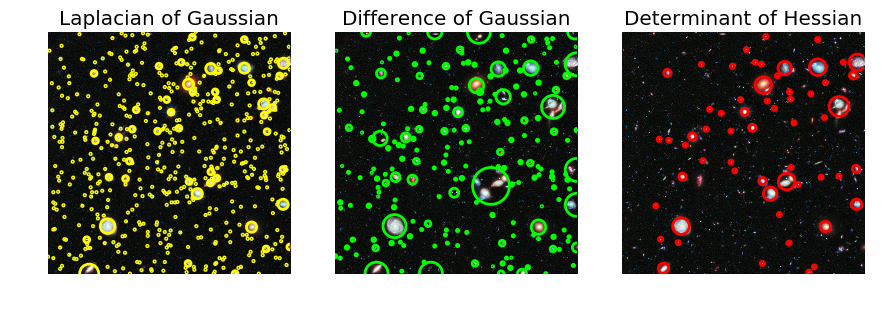

In [93]:
from math import sqrt
from skimage import data
from skimage.feature import blob_dog, blob_log, blob_doh
from skimage.color import rgb2gray

import matplotlib.pyplot as plt


image = data.hubble_deep_field()[0:500, 0:500]
image_gray = rgb2gray(image)

blobs_log = blob_log(image_gray, max_sigma=30, num_sigma=10, threshold=.1)

# Compute radii in the 3rd column.
blobs_log[:, 2] = blobs_log[:, 2] * sqrt(2)

blobs_dog = blob_dog(image_gray, max_sigma=30, threshold=.1)
blobs_dog[:, 2] = blobs_dog[:, 2] * sqrt(2)

blobs_doh = blob_doh(image_gray, max_sigma=30, threshold=.01)

blobs_list = [blobs_log, blobs_dog, blobs_doh]
colors = ['yellow', 'lime', 'red']
titles = ['Laplacian of Gaussian', 'Difference of Gaussian',
          'Determinant of Hessian']
sequence = zip(blobs_list, colors, titles)

fig, axes = plt.subplots(1, 3, figsize=(9, 3), sharex=True, sharey=True,
                         subplot_kw={'adjustable': 'box-forced'})
ax = axes.ravel()

for idx, (blobs, color, title) in enumerate(sequence):
    ax[idx].set_title(title)
    ax[idx].imshow(image, interpolation='nearest')
    for blob in blobs:
        y, x, r = blob
        c = plt.Circle((x, y), r, color=color, linewidth=2, fill=False)
        ax[idx].add_patch(c)
    ax[idx].set_axis_off()

plt.tight_layout()
plt.show()

In [101]:
# test = np.array([[1, 2], [3, 4], [5, 6]])
# print test[0,:]
# print test[:,0]
# print test[:,1]
print int(floor(1.88))

1
